<a href="https://colab.research.google.com/github/Camilojaravila/202210_MINE-4206_ANALISIS_CON_MACHINE_LEARNING/blob/main/Taller%201/Laboratorio%201.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

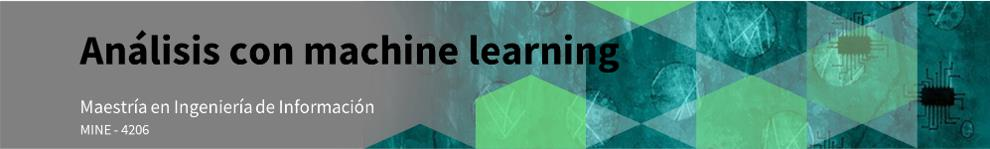

El gobierno de California ha realizado un censo inmobiliario para poder determinar cuáles son las características que hacen una propiedad tenga un mayor valor. Para esto obtuvo el valor de cada una de las características inmobiliarias y, para evitar tomar decisiones particulares por cada inmueble, se decidió agrupar la información por cuadras, y evitar sobreestimaciones o subestimaciones de algún inmueble en particular. El gobierno quiere obtener estas características para impulsar el mercado inmobiliaro en cada una de las regiones y así reactivar y controlar el sector. Para esto, le han contratado para realizar la consultoría de este caso.


Objetivos:
* Resolver un problema de Aprendizaje de Datos.
* Revisar los conceptos básicos de una Regresión Lineal.
* Familiarizarse con la herramienta de Jupyter Notebook.

## 0. Importación de Librerías.

Las librerías que se van a utilizar, por lo general se tienen que instalar desde consola para que se encuentren dentro del ambiente donde se está ejecutando el Notebook. Sin embargo, si se encuentran en un ambiente compartido como Google Colab o simplemente desean realizar la instalación de los paquetes desde el mismo notebook lo pueden hacer con el siguiente código

```
!pip install [nom_paquete]
```

Como por ejemplo:
```
!pip install pandas
```



In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


Para este ejercicio, utilizaremos las siguientes librerías.

In [ ]:
#Manejo de datos
import pandas as pd
import numpy as np

#Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Analisis profundo de datos
from pandas_profiling import ProfileReport

#Entrenamiento del modelo
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures 
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler

## 1. Entendimiento del Negocio

Luego de hablar con el equipo del censo, le preguntamos que significaba cada una de las variables que había logrado capturar en la encuesta. Dándonos los siguientes resultados:

1. Median House Value: Valor medio de la casa para esa cuadra.
2. Median Income: Valor medio de ingreso de los habitantes para esa cuadra.
3. Median Age: Edad Media de la casa para esa cuadra. (Entre menor el número, más nuevo).
4. Total Rooms: Número total de cuartos en esa cuadra.
5. Total Bedrooms: Número total de habitaciones en esa cuadra.
6. Population: Número total de habitantes en esa cuadra.
7. Households: Numero total de casas en esa cuadra.
8. Latitude: Latitud medida en grados.
9. Longitude: Longitud medida en grados.
10. Distance to coast: Distancia a la costa mas cercana [m].
11. Distance to Los Angeles: Distancia al centro de Los Angeles [m].
12. Distance to San Diego: Distancia al centro de San Diego [m]
13. Distance to San Jose: Distancia al centro de San Jose [m]
14. Distance to San Francisco: Distancia al centro de San Francisco [m]

## 2. Entendimiento de los Datos

Luego de entender el negocio y su objetivo, vamos a realizar la exploración de datos. Así que, leeremos los datos.

In [ ]:
url = 'California_Houses.csv'

data = pd.read_csv(url)
data.head() #Veremos las primeras líneas del dataset, para ver si leyó correctamente

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
0,452600.0,8.3252,41,880,129,322,126,37.88,-122.23,9263.040773,556529.158342,735501.806984,67432.517001,21250.213767
1,358500.0,8.3014,21,7099,1106,2401,1138,37.86,-122.22,10225.733072,554279.850069,733236.884360,65049.908574,20880.600400
2,352100.0,7.2574,52,1467,190,496,177,37.85,-122.24,8259.085109,554610.717069,733525.682937,64867.289833,18811.487450
3,341300.0,5.6431,52,1274,235,558,219,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568
4,342200.0,3.8462,52,1627,280,565,259,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568


Para poder realizar e entrenamiento de nuestros algoritmos. Primero necesitaremos dividir nuestros datos en datos de entrenamiento (train) y datos de evaluación (test). Esto con el fin de poder descubrir como le iria al modelo entrenado con datos de la población que no ha conocido antes. Por lo general, se recomienda realizar un partición aleatoria y dejar una proporción $80\% - 20\%$. Sin embargo, estas divisiones pueden variar dependiendo el tipo de datos y el entrenamiento que estemos desarrollando. 

In [ ]:
train, test = train_test_split(data, test_size=0.2, random_state=33)
train.head()

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
3578,275300.0,2.9076,24,2718,719,3018,644,34.24,-118.53,23657.636674,33617.824551,211764.648663,458723.151688,526733.042849
11132,163900.0,4.2019,25,1026,288,1646,283,33.85,-117.93,19887.918652,36644.622486,144967.660334,527729.843217,595764.801847
14862,150000.0,2.6296,25,3509,985,2359,899,32.65,-117.09,4439.268497,189189.852033,9883.899190,680125.370743,748095.266383
4929,88200.0,1.6731,41,1425,372,1803,353,33.99,-118.24,20338.631866,6928.535718,173544.456158,497198.958683,565216.208568
7805,171500.0,3.6875,42,1150,215,708,204,33.89,-118.09,16855.925994,22940.742732,156527.899751,514650.681826,582676.057883


Utilizaremos la libreria de `pandas-profiling` para realizar una exploración de datos más profunda

In [ ]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

También podemos realizar nuestros propios análisis. 

In [ ]:
corr = train.corr()
corr.style.background_gradient(cmap='coolwarm')

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
Median_House_Value,1.000000,0.683463,0.103446,0.132518,0.052628,-0.024629,0.067433,-0.143224,-0.045998,-0.468739,-0.129419,-0.091474,-0.038908,-0.028658
Median_Income,0.683463,1.000000,-0.120623,0.198975,-0.005660,0.007175,0.015010,-0.080422,-0.012627,-0.241304,-0.064733,-0.056349,-0.031852,-0.017996
Median_Age,0.103446,-0.120623,1.000000,-0.360671,-0.320132,-0.299044,-0.302088,0.013492,-0.111875,-0.228094,-0.030240,0.038870,-0.094267,-0.105838
Tot_Rooms,0.132518,0.198975,-0.360671,1.000000,0.930810,0.864699,0.919150,-0.038485,0.047222,-0.001451,-0.020846,-0.040973,0.034434,0.035237
Tot_Bedrooms,0.052628,-0.005660,-0.320132,0.930810,1.000000,0.885137,0.979798,-0.067393,0.068926,-0.023630,-0.055655,-0.068003,0.059765,0.060233
Population,-0.024629,0.007175,-0.299044,0.864699,0.885137,1.000000,0.914492,-0.108589,0.099225,-0.039520,-0.110493,-0.109283,0.077534,0.087187
Households,0.067433,0.015010,-0.302088,0.919150,0.979798,0.914492,1.000000,-0.071563,0.055150,-0.063477,-0.061820,-0.069081,0.047288,0.049510
Latitude,-0.143224,-0.080422,0.013492,-0.038485,-0.067393,-0.108589,-0.071563,1.000000,-0.924636,0.305846,0.942273,0.991612,-0.859072,-0.900285
Longitude,-0.045998,-0.012627,-0.111875,0.047222,0.068926,0.099225,0.055150,-0.924636,1.000000,0.005881,-0.892373,-0.958461,0.927290,0.957091
Distance_to_coast,-0.468739,-0.241304,-0.228094,-0.001451,-0.023630,-0.039520,-0.063477,0.305846,0.005881,1.000000,0.201012,0.216912,-0.077532,-0.068613


In [ ]:
sns.pairplot(train[['Median_House_Value','Median_Income','Median_Age','Tot_Bedrooms','Population','Households','Latitude','Longitude']])

In [ ]:
sns.pairplot(train[['Distance_to_coast','Distance_to_LA','Distance_to_SanDiego','Distance_to_SanJose','Distance_to_SanFrancisco','Latitude','Longitude']])

## 3. Preparación de los datos

Según lo propuesto por el negocio, nuestro objetivo será predecir el valor medio de cada casa (Y) basado en sus características (X). Ya que entendimos que significa cada uno de nuestros atributos, realizaremos la separación de los datos

In [ ]:
X_train, y_train = train.drop(['Median_House_Value'],axis=1), train['Median_House_Value'] 
display(X_train)
y_train

,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
3578,2.9076,24,2718,719,3018,644,34.24,-118.53,23657.636674,33617.824551,211764.648663,458723.151688,526733.042849
11132,4.2019,25,1026,288,1646,283,33.85,-117.93,19887.918652,36644.622486,144967.660334,527729.843217,595764.801847
14862,2.6296,25,3509,985,2359,899,32.65,-117.09,4439.268497,189189.852033,9883.899190,680125.370743,748095.266383
4929,1.6731,41,1425,372,1803,353,33.99,-118.24,20338.631866,6928.535718,173544.456158,497198.958683,565216.208568
7805,3.6875,42,1150,215,708,204,33.89,-118.09,16855.925994,22940.742732,156527.899751,514650.681826,582676.057883
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10435,4.0647,23,4052,955,1950,859,33.43,-117.62,19742.553791,90070.878987,90201.899097,581794.993069,649819.560878
57,0.8172,52,1489,335,728,244,37.82,-122.28,3585.765695,554471.916071,733280.441798,63761.735317,14244.882533
578,4.6350,36,3541,570,1478,529,37.71,-122.06,12679.563642,532469.836053,711421.799887,44171.417310,33414.131781
5848,3.1587,11,3112,890,1700,851,34.18,-118.31,25560.773645,15463.030189,194604.865969,477035.873638,545069.955664


3578     275300.0
11132    163900.0
14862    150000.0
4929      88200.0
7805     171500.0
           ...   
10435    240600.0
57        85300.0
578      248600.0
5848     181300.0
2439      92700.0
Name: Median_House_Value, Length: 16512, dtype: float64

## 4. Modelamiento

Ya con nuestros datos separados, realizaremos la etapa de entrenamiento de nuestro modelo. Para eso, utilizaremos la libreria de `scikit-learn`.

En `scikit-learn`, la mayoría de modelos integrados siguen la misma lógica:
1. Realizamos la inicialización del Modelo junto a los argumentos necesarios.
2. Llamamos al método `fit()` que recibe como parámetros las variables explicativas $X$ y la variabe predictora $Y$.
3. Podremos obtener nuestras predicciones del modelo llamando el método `transform()` y las variables explicativas que deseamos predecir.

Para cada tipo de modelo, se pueden encontrar diferentes métodos y atributos adicionales, como en el caso de la Regresión Lineal el `coef_` y el `intercept_`, para más información, pueden entrar a la página de [Scikit-Learn](https://scikit-learn.org/stable/).


In [ ]:
LinearModel = LinearRegression()
LinearModel.fit(X_train, y_train)
print('Coefficients: ', LinearModel.coef_)
print('Intercept: ',LinearModel.intercept_)

Coefficients:  [ 3.92756982e+04  8.04908727e+02 -5.66781693e+00  9.89262244e+01
 -4.44481884e+01  6.16503083e+01 -4.59040445e+04 -2.72385831e+04
 -2.27939120e-01 -1.58475532e-01  2.59430943e-01  1.78794813e-01
 -1.54447951e-01]
Intercept:  -1649205.4876500214


Para entender mejor los parámetros obtenidos, vamos a asociarlos a cada atributo.

In [ ]:
coef = dict(zip(X_train.columns, LinearModel.coef_))
coef

{'Distance_to_LA': -0.15847553157868788,
 'Distance_to_SanDiego': 0.25943094260082944,
 'Distance_to_SanFrancisco': -0.15444795056316707,
 'Distance_to_SanJose': 0.17879481297933353,
 'Distance_to_coast': -0.22793911970802583,
 'Households': 61.65030833579017,
 'Latitude': -45904.0444713381,
 'Longitude': -27238.583073552123,
 'Median_Age': 804.9087272400858,
 'Median_Income': 39275.698235560165,
 'Population': -44.44818837435398,
 'Tot_Bedrooms': 98.92622439330425,
 'Tot_Rooms': -5.66781693202389}

## 5. Evaluación

Para mirar el rendimiento de nuestro modelo, vamos a utilizar nuestros datos de entrenamiento y evaluación.

In [ ]:
y_pred = LinearModel.predict(X_train)
y_pred

array([147308.78604646, 190914.16713135, 170551.01064158, ...,
       258778.91499825, 227930.07922864,  76110.22965475])

Para determinar nuestro rendimiento, vamos a utilizar dos métricas, el $MSE$ y el $R^2$.

In [ ]:
n,p = X_train.shape

print('------------ Regresión Lineal ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred))
print("R2-score: %.5f" % r2_score(y_train, y_pred) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred))*(n-1)/(n-p-1)) )

------------ Regresión Lineal ------------
Residual sum of squares (MSE): 4694600347.31
R2-score: 0.64555
Adj R2-score: 0.64528


Y realizaremos una gráfica para ver como es el comportamiento de los datos reales vs los datos predecidos.

In [ ]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_train[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

## Normalización

Vamos a ver que pasa si normalizamos los datos.

### Preparación de Datos

In [ ]:
columns = X_train.columns
scaler = StandardScaler()
X_train_norm = scaler.fit_transform(X_train)
X_train_norm = pd.DataFrame(X_train_norm,columns=columns)
X_train_norm

,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
0,-0.507164,-0.373423,0.035263,0.420675,1.412515,0.371335,-0.649835,0.517335,-0.341944,-0.949786,-0.641758,0.504024,0.558890
1,0.183438,-0.294184,-0.728400,-0.590133,0.192703,-0.564439,-0.832950,0.817707,-0.419022,-0.937535,-0.873145,0.821896,0.834931
2,-0.655497,-0.294184,0.392271,1.044514,0.826614,1.032339,-1.396381,1.238229,-0.734894,-0.320100,-1.341080,1.523890,1.444062
3,-1.165859,0.973635,-0.548317,-0.393131,0.332288,-0.382987,-0.767216,0.662515,-0.409806,-1.057812,-0.774154,0.681259,0.712775
4,-0.091031,1.052873,-0.672434,-0.761337,-0.641250,-0.769220,-0.814169,0.737608,-0.481016,-0.993002,-0.833100,0.761648,0.782592
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16507,0.110232,-0.452661,0.637348,0.974156,0.462982,0.928652,-1.030150,0.972900,-0.421994,-0.721289,-1.062856,1.070942,1.051082
16508,-1.622543,1.845260,-0.519431,-0.479905,-0.623469,-0.665534,1.031067,-1.359992,-0.752346,1.158399,1.164791,-1.315323,-1.490420
16509,0.414528,0.577441,0.406714,0.071231,0.043338,0.073235,0.979419,-1.249856,-0.566408,1.069344,1.089072,-1.405564,-1.413767
16510,-0.373184,-1.403526,0.213090,0.821714,0.240713,0.907915,-0.678006,0.627471,-0.303031,-1.023269,-0.701200,0.588380,0.632215


### Modelamiento

In [ ]:
LinearModel2 = LinearRegression()
LinearModel2.fit(X_train_norm, y_train)
print('Coefficients: ', LinearModel2.coef_)
print('Intercept: ',LinearModel2.intercept_)

Coefficients:  [ 73608.98632458  10158.02861987 -12557.81576883  42181.33352609
 -49993.70696927  23783.26209306 -97766.84536382 -54409.63508081
 -11148.01752281 -39153.41601154  74892.70201767  38814.4933123
 -38624.08258206]
Intercept:  206619.87954215126


In [ ]:
coef2 = dict(zip(X_train_norm.columns, LinearModel2.coef_))
coef2

{'Distance_to_LA': -39153.416011539826,
 'Distance_to_SanDiego': 74892.70201766706,
 'Distance_to_SanFrancisco': -38624.08258206267,
 'Distance_to_SanJose': 38814.49331230279,
 'Distance_to_coast': -11148.017522807742,
 'Households': 23783.262093059933,
 'Latitude': -97766.84536381645,
 'Longitude': -54409.635080812805,
 'Median_Age': 10158.028619867222,
 'Median_Income': 73608.98632457858,
 'Population': -49993.70696926678,
 'Tot_Bedrooms': 42181.33352608525,
 'Tot_Rooms': -12557.815768834218}

### Evaluación

In [ ]:
y_pred2 = LinearModel2.predict(X_train_norm)
y_pred2

array([147308.78604644, 190914.16713131, 170551.01064155, ...,
       258778.9149983 , 227930.07922861,  76110.22965476])

In [ ]:
n,p = X_train_norm.shape

print('------------ Regresión Lineal ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred2))
print("R2-score: %.5f" % r2_score(y_train, y_pred2) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred2))*(n-1)/(n-p-1)) )

------------ Regresión Lineal ------------
Residual sum of squares (MSE): 4694600347.31
R2-score: 0.64555
Adj R2-score: 0.64528


In [ ]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred2[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_train[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

## Regresión polinomial

Y si intentamos utilizar una Regresión Polinomial?

### Preparación de Datos

In [ ]:
import itertools

columns = X_train.columns
k = 2 #Grado a evaluar
X_train_pol = pd.concat([X_train**(i+1) for i in range(k)],axis=1) #Polinomios sin interacciones
X_train_pol.columns = np.reshape([[i+' '+str(j+1) for i in columns] for j in range(k)],-1)
temp = pd.concat([X_train[i[0]]*X_train[i[1]] for i in list(itertools.combinations(columns, 2))],axis=1) #Combinaciones sólo de grado 1
temp.columns = [' '.join(i) for i in list(itertools.combinations(columns, 2))]
X_train_pol = pd.concat([X_train_pol,temp],axis=1)


PolyModel = LinearRegression().fit(X_train_pol, y_train)
print ('Coefficients: ', PolyModel.coef_)
print ('Intercept: ',PolyModel.intercept_)

Coefficients:  [-1.06661947e+06 -4.91891127e+04  6.02403067e+01 -2.61671866e+03
 -1.22211127e+03  6.21476415e+03  1.57935531e+03 -2.56448088e+02
  8.36432076e+01  1.53305784e+03 -1.82907643e+03 -7.86790822e+01
  4.92969717e+02 -1.75471551e+03  2.12407240e+01 -5.90226262e-04
 -1.34454226e-01  8.24416160e-03 -4.93031318e-02  6.71975069e+05
  3.03308222e+05 -8.67612631e-07 -2.81400777e-02  1.69786353e-02
  4.67103096e-02 -3.55538981e-02  1.42696821e+02  8.02920143e+00
 -3.40508224e+01 -6.49938997e+00  9.83248173e+00  1.05815731e+04
 -6.69337523e+03 -1.40887059e-01  9.06510500e-03 -1.44350713e-01
  6.34222342e-03 -1.84073074e-02 -1.24460855e-01  2.58867856e+00
 -1.26355113e+00  2.53970685e+00 -2.62175483e+02 -4.83870892e+02
  2.80650245e-03  1.03831514e-03 -3.65105431e-03  6.95015595e-03
 -6.78699840e-03  1.98033528e-02 -8.09427985e-03  1.29932722e-02
 -1.42987711e+00  4.57456757e-01  1.11029192e-04  2.92309560e-05
  4.98752343e-06 -6.28394046e-05  6.20172832e-05 -1.11038818e-04
  9.299666

### Modelamiento

In [ ]:
coef_pol = dict(zip(X_train_pol.columns, PolyModel.coef_))
coef_pol

{'Distance_to_LA 1': 1533.0578443884283,
 'Distance_to_LA 2': -0.028140077683734888,
 'Distance_to_LA Distance_to_SanDiego': -2.799039430101402e-05,
 'Distance_to_LA Distance_to_SanFrancisco': -0.0008602033922215924,
 'Distance_to_LA Distance_to_SanJose': 0.0006992995586188044,
 'Distance_to_SanDiego 1': -1829.0764323621431,
 'Distance_to_SanDiego 2': 0.01697863530804475,
 'Distance_to_SanDiego Distance_to_SanFrancisco': 0.0009654370369389653,
 'Distance_to_SanDiego Distance_to_SanJose': -0.0007702752463956131,
 'Distance_to_SanFrancisco 1': 492.9697166678086,
 'Distance_to_SanFrancisco 2': -0.03555389805018855,
 'Distance_to_SanJose 1': -78.6790822497885,
 'Distance_to_SanJose 2': 0.046710309591301624,
 'Distance_to_SanJose Distance_to_SanFrancisco': -5.072213025414385e-05,
 'Distance_to_coast 1': 83.64320764132903,
 'Distance_to_coast 2': -8.676126313222898e-07,
 'Distance_to_coast Distance_to_LA': 2.3395878088194877e-06,
 'Distance_to_coast Distance_to_SanDiego': 2.1476334950421005e

### Evaluación

In [ ]:
y_pred3 = PolyModel.predict(X_train_pol)
y_pred3

array([155704.26040459, 175721.62299442, 164134.10169649, ...,
       239127.22878122, 245920.64171171,  70473.1921711 ])

In [ ]:
n,p = X_train_pol.shape

print('------------ Regresión Lineal ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred3))
print("R2-score: %.5f" % r2_score(y_train, y_pred3) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred3))*(n-1)/(n-p-1)) )

------------ Regresión Lineal ------------
Residual sum of squares (MSE): 3461302343.75
R2-score: 0.73867
Adj R2-score: 0.73701


In [ ]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred3[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_train[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

## Despliegue

Al darnos un mejor resultado, nos deja las siguientes preguntas...
* ¿Qué pasa si intentamos normalizar este modelo?
* ¿Qué pasa si le quito las variables que están altamente correlacionadas?
* ¿Qué pasa si aumento el grado de la Regresión Polinomial?

Entre otras...

Al final, todas estas preguntas hacen parte de la 'Selección del modelo'. Y la selección de estos atributos (Normalización, Selección de variables, Grado del polinomio) son lo que se ocnocen como Hiperparámetros del Modelo.

Por ahora, quedaremos satisfechos con el rendimiento de nuestro último modelo. Ahora, ¿Cómo le irá con datos que el no conoce?

In [ ]:
test.head()

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
10773,441100.0,6.6320,27,3310,598,1402,563,33.65,-117.90,5887.733647,54842.810726,1.245814e+05,546346.674347,614362.035909
2552,81300.0,2.2227,30,1895,366,990,359,40.77,-124.17,1714.506196,911590.350774,1.090972e+06,429500.103612,365197.855409
1731,110000.0,6.0426,19,392,109,287,81,37.97,-122.34,4118.761687,570416.292022,7.493741e+05,80786.229226,23223.725150
6342,105800.0,1.9762,52,1171,318,1126,276,34.06,-117.75,48392.475131,45488.118443,1.591607e+05,522019.963268,589975.949792
8912,366700.0,3.1635,30,2075,687,1026,592,34.02,-118.49,1521.470879,22978.294391,1.904238e+05,479914.595279,547854.909677


Para que nuestro algoritmo entienda los datos que vamos a utilizar, hay que pasar por la etapa de preparación de datos, pero esta vez no aprendiendo los atributos (Como la mediao la desviación de los datos, o la selección del grado del polinomio). Sino que utilizaremos lo que ya hemos aprendido antes.

In [ ]:
X_test, y_test = test.drop(['Median_House_Value'],axis=1), test['Median_House_Value'] 
display(X_test)
y_test

,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
10773,6.6320,27,3310,598,1402,563,33.65,-117.90,5887.733647,54842.810726,1.245814e+05,546346.674347,614362.035909
2552,2.2227,30,1895,366,990,359,40.77,-124.17,1714.506196,911590.350774,1.090972e+06,429500.103612,365197.855409
1731,6.0426,19,392,109,287,81,37.97,-122.34,4118.761687,570416.292022,7.493741e+05,80786.229226,23223.725150
6342,1.9762,52,1171,318,1126,276,34.06,-117.75,48392.475131,45488.118443,1.591607e+05,522019.963268,589975.949792
8912,3.1635,30,2075,687,1026,592,34.02,-118.49,1521.470879,22978.294391,1.904238e+05,479914.595279,547854.909677
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19429,3.4167,31,906,146,383,129,37.67,-121.06,59246.363871,475584.428157,6.548229e+05,82361.970086,121162.689882
6179,4.2986,36,1479,251,741,245,34.08,-117.92,42457.363663,29974.802613,1.672591e+05,509527.875177,577531.392695
1056,1.9362,17,5273,1177,2446,1199,39.77,-121.85,166280.213178,711889.040813,8.896555e+05,270732.118347,227595.691042
15464,3.6736,2,4624,946,2091,808,33.16,-117.23,10625.445011,136585.034472,4.981675e+04,628204.791855,696238.935174


10773    441100.0
2552      81300.0
1731     110000.0
6342     105800.0
8912     366700.0
           ...   
19429    196900.0
6179     189600.0
1056      89900.0
15464    214500.0
2384      80000.0
Name: Median_House_Value, Length: 4128, dtype: float64

In [ ]:
columns = X_test.columns
k = 2 #Grado a evaluar
X_test_pol = pd.concat([X_test**(i+1) for i in range(k)],axis=1) #Polinomios sin interacciones
X_test_pol.columns = np.reshape([[i+' '+str(j+1) for i in columns] for j in range(k)],-1)
temp = pd.concat([X_test[i[0]]*X_test[i[1]] for i in list(itertools.combinations(columns, 2))],axis=1) #Combinaciones sólo de grado 1
temp.columns = [' '.join(i) for i in list(itertools.combinations(columns, 2))]
X_test_pol = pd.concat([X_test_pol,temp],axis=1)

In [ ]:
y_pred_test = PolyModel.predict(X_test_pol)
y_pred_test

array([351931.93937397,  65098.48399115, 282231.38116264, ...,
        76995.34094   , 207196.3946476 ,  55014.37487221])

In [ ]:
n,p = X_test_pol.shape

print('------------ Regresión Lineal ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

------------ Regresión Lineal ------------
Residual sum of squares (MSE): 6277535178.39
R2-score: 0.53831
Adj R2-score: 0.52637


In [ ]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred_test[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_test[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()